## Análisis de datos de siniestros viales en CABA 

* Librerias Necesarias:

In [2]:
import pandas as pd
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
import folium

El Observatorio de Movilidad y Seguridad Vial (OMSV), centro de estudios que se encuentra bajo la órbita de la Secretaría de Transporte del Gobierno de la Ciudad Autónoma de Buenos Aires, se asume que nos solicitan la elaboración de un proyecto de anális de datos, con el fin de generar información que le permita a las autoridades locales tomar medidas para disminuir la cantidad de víctimas fatales de los siniestros viales. Para ello, nos disponibilizan un dataset sobre homicidios en siniestros viales y otro sobre lesiones en siniestros viales acaecidos en la Ciudad de Buenos Aires durante el periodo 2016-2021. Cada DataSet tiene dos hojas, una de hechos y otra de víctimas.

    NOTA: Los DataSets fueron tomados de Buenos Aires Data: https://data.buenosaires.gob.ar/dataset/victimas-siniestros-viales

In [3]:
# Cargar los datos en DataFrames
homicidios_hechos = pd.read_excel('homicidios.xlsx', sheet_name= 'HECHOS')
homicidios_victimas = pd.read_excel('homicidios.xlsx', sheet_name= 'VICTIMAS')
lesiones_hechos = pd.read_excel('lesiones.xlsx', sheet_name= 'HECHOS')
lesiones_victimas = pd.read_excel('lesiones.xlsx', sheet_name= 'VICTIMAS')

    NOTA: Tener en cuenta que cuando en los DataFrames se encuentra "SD", significa "Sin Datos".

Para llevar a cabo un proyecto de análisis de datos con el fin de generar información que permita a las autoridades locales tomar medidas para disminuir la cantidad de víctimas fatales de siniestros viales en la Ciudad Autónoma de Buenos Aires, es importante seguir un proceso estructurado. Acontinuación se encuentra el esquema a seguir para realizar dicho análisis:

1. Limpieza y preparación de los datos.
2. Exploración de datos y análisis descriptivo.
3. Análisis de víctimas.
4. Análisis espacial.
5. Creación de KIPs y métricas clave.
6. Conclusiones y sugerencias

# 1. Limpieza y preparación de los datos.

Antes de inciar a trabajar los datos para seguidamente sacar conclusiones, es crucial identificar cuales son los datos que vamos a utilizar, por qué los vamos a utilizar, y estandarizarlos para mejor manejo de la base de datos:

-- Hocimidios


* Para efectos del análisis no es necesario identificar o guardar los id's en ninguno de los dataset.
* Dato que ya tenemos la columna FECHA, no necesitamos las columnas AAAA, MM, DD, HH. (HORA no se elimina porque podría resultar útil para identificar 'horas pico' en que ocurren los siniestros).
* El lugar del hecho específico no nos resulta de provecho por lo tanto se eliminan todas las columnas relacionadas a este, en su lugar se mantendran las columnas TIPO_DE_CALLE y COMUNA.
* La columna PARTICIPANTES es la relación VICTIMA-ACUSADO, por lo tanto viene siendo información redundante.


In [4]:
columnas_a_eliminar = ['ID','AAAA','MM','DD','HH','LUGAR_DEL_HECHO','Calle','Altura','XY (CABA)','Cruce','Dirección Normalizada','PARTICIPANTES']
homicidios_hechos.drop(columns=columnas_a_eliminar, inplace=True)

* Para efectos del análisis no necesitamos la fecha del fallecimiento pero si la fecha del siniestro

In [5]:
columnas_a_eliminar = ['ID_hecho','AAAA','MM','DD','FECHA_FALLECIMIENTO']
homicidios_victimas.drop(columns=columnas_a_eliminar, inplace=True)

-- Lesiones

* En las columnas moto, auto, transporte_publico, camion y ciclista la x marcada indica a la víctima, pero como ya tenemos esa columna todas las demás columnas no son de utilidad.

In [6]:
columnas_a_eliminar = ['id','aaaa','mm','dd','franja_hora','direccion_normalizada','participantes','otra_direccion','calle','altura','cruce','geocodificacion_CABA','moto','auto','transporte_publico','camion','ciclista']
lesiones_hechos.drop(columns=columnas_a_eliminar, inplace=True)

In [7]:
columnas_a_eliminar = ['ID hecho','AAA','MM','DD']

lesiones_victimas.drop(columns=columnas_a_eliminar, inplace=True)

    NOTA: Tener en cuenta que rol es la posición relativa al vehículo que presentaba la víctima en el momento del siniestro. Ejemplo: Víctima - MOTO , Rol - Pasajero_acompañante

-- Ajustes generales

En este caso, los ajustes son sólo necesarios para los DataFrames de Lesiones
* Todos los datos deben de estar estandarizados o en mayúsculas o enb minúsculas. Como la mayoría están en mayúsculas entonces se modifican algunas columnas para que toda la información quede prolija.
* Todas las fechas deben tener el formato AAA-MM-DD.
* Las columnas de sexo se estandarizan como "masculino" o "femenino".

In [8]:
# Renombrar Latitud y Longitud
homicidios_hechos.rename(columns={'pos y':'LATITUD','pos x':'LONGITUD'}, inplace=True)

In [9]:
# Colocar el mismo nombre de columnas entre DataFrames
homicidios_victimas.rename(columns={'EDAD':'EDAD_VICTIMA'}, inplace=True)

In [10]:
# Definir una función para convertir la fecha en otro formato
def convertir_a_fecha(fecha):
    try:
        # Intenta convertir la fecha y hora en el formato "%Y-%m-%d %H:%M:%S"
        fecha_objeto = datetime.strptime(fecha, "%Y-%m-%d %H:%M:%S")
        return fecha_objeto.strftime("%Y-%m-%d")
    except ValueError:
        try:
            # Si no se puede convertir en el formato anterior, intenta el formato "%m/%d/%Y"
            fecha_objeto = datetime.strptime(fecha, "%m/%d/%Y")
            return fecha_objeto.strftime("%Y-%m-%d")
        except ValueError:
            # Si ninguno de los formatos es válido, devuelve None o maneja el error de otra manera
            return None

# Asegurarse de que la columna 'fecha' sea una cadena (string)
lesiones_hechos['fecha'] = lesiones_hechos['fecha'].astype(str)

# Aplicar la función 'convertir_a_fecha' a toda la columna 'fecha'
lesiones_hechos['fecha'] = lesiones_hechos['fecha'].apply(convertir_a_fecha)

In [11]:
# Cambiar los nombres de las columnas usando rename
nombres_nuevos = {'n_victimas': 'N_VICTIMAS','fecha':'FECHA','hora': 'HORA', 'comuna':'COMUNA','tipo_calle':'TIPO_DE_CALLE','victima':'VICTIMA','acusado':'ACUSADO','gravedad':'GRAVEDAD','longitud':'LONGITUD','latutid':'LATITUD'}
lesiones_hechos.rename(columns=nombres_nuevos, inplace=True)

# Pasar toda la información de GRAVEDAD a mayúsculas
lesiones_hechos['GRAVEDAD'] = lesiones_hechos['GRAVEDAD'].str.upper()

In [12]:
# Pasar toda la información a mayúsculas
lesiones_victimas['VEHICULO_VICTIMA'] = lesiones_victimas['VEHICULO_VICTIMA'].str.upper()
lesiones_victimas.rename(columns={'FECHA ':'FECHA'}, inplace=True)

lesiones_victimas['EDAD_VICTIMA'] = lesiones_victimas['EDAD_VICTIMA'].str.upper()

In [13]:
lesiones_victimas['SEXO'] = lesiones_victimas['SEXO'].str.upper().replace("MUJER ","MUJER")

# Estandarizar los sexos como masculino o femenino
for i in range(len(lesiones_victimas)):
    if lesiones_victimas['SEXO'][i] == 'VARON':
        lesiones_victimas['SEXO'][i] = 'MASCULINO'
    if lesiones_victimas['SEXO'][i] == 'MUJER':
        lesiones_victimas['SEXO'][i] = 'FEMENINO'

C:\Users\Leidy Hernandez\AppData\Local\Temp\ipykernel_8444\2373880951.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lesiones_victimas['SEXO'][i] = 'MASCULINO'
C:\Users\Leidy Hernandez\AppData\Local\Temp\ipykernel_8444\2373880951.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lesiones_victimas['SEXO'][i] = 'MASCULINO'
C:\Users\Leidy Hernandez\AppData\Local\Temp\ipykernel_8444\2373880951.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

Con todos estos ajustes tenemos todas las tablas organizadas, estandarizadas y sin datos nulos. 

# 2. Exploración de datos y análisis descriptivo.

Ahora que los datos están listos para ser tratados se va a tratar de extraer la mayor cantidad de información importante para tomar medidas y disminuir la cantidad de víctimas fatales de los siniestros viales. Por lo tanto, lo ideal será conocer la tasa de homicidios y lesiones viales, analizar la distribución de horas y dias de la semana con más siniestros viales, explorar la hubicación de los homicidios y/o la gravedad de las lesiones, e identificar las tendencias a lo largo de los años.

    NOTA: Para todo este proceso se debe conocer la población total de Buenos Aires, dado que no se encontraron datos históricos se tomó las proyeccciones anuales encontradas en Buenos Aires Data, en el archivo CABA1040.xls: https://view.officeapps.live.com/op/view.aspx?src=https%3A%2F%2Fwww.estadisticaciudad.gob.ar%2Feyc%2Fwp-content%2Fuploads%2F2040%2F05%2FCABA1040.xls&wdOrigin=BROWSELINK

In [14]:
poblacion_anual = pd.DataFrame()
año = list(range(2016,2022))
tot_pob = [3059122, 3063728, 3068043, 3072029, 3075646, 3078836]
poblacion_anual['AÑO'] = año
poblacion_anual['POBLACION_TOTAL'] = tot_pob

-- Homicidios Viales

•	Calcular la tasa de homicidios viales (número de homicidios viales por año o mes) como un KPI para seguimiento.

La tasa de homicidios viales anuales proporciona una perspectiva a largo plazo sobre la incidencia de dichos casos en CABA durante un año completo. Esto permite identificar tendencias y patrones a lo largo de varios años y evaluar el impacto de políticas y medidas de seguridad a largo plazo.

In [15]:
# Agrupar la cantidad de casos de homicidio vial por año
contador = list(np.zeros(len(poblacion_anual)))
for i in range(len(homicidios_victimas)):
    for j in range(len(poblacion_anual)):
        if homicidios_victimas['FECHA'][i].year == poblacion_anual['AÑO'][j]:
            contador[j] += 1
            contador[j] = int(contador[j])
poblacion_anual['HOMICIDIOS_VIALES'] = contador

# Calcular la tasa de homicidios viales por año 
rate = []
for i in range(len(poblacion_anual)):
    rate.append(round((poblacion_anual['HOMICIDIOS_VIALES'][i]/poblacion_anual['POBLACION_TOTAL'][i])*100000,2))
poblacion_anual['TASA_HOMICIDIOS'] = rate

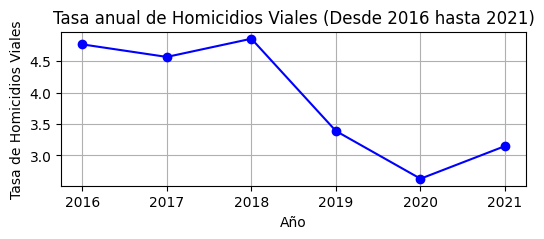

In [16]:
# Graficar la tasa de homicidios anuales
# Configurar el tamaño del gráfico
plt.figure(figsize=(6, 2))

# Crear el gráfico de líneas
plt.plot(poblacion_anual['AÑO'], poblacion_anual['TASA_HOMICIDIOS'], marker='o', linestyle='-', color='b')

# Agregar etiquetas a los ejes y un título
plt.xlabel('Año')
plt.ylabel('Tasa de Homicidios Viales')
plt.title('Tasa anual de Homicidios Viales (Desde 2016 hasta 2021)')

# Mostrar la cuadrícula
plt.grid(True)

# Mostrar el gráfico
plt.show()

Como se puede observar, a partir de 2018 se ve una reducción considerable en la tasa de homicidios viales. Se puede considerar que esto debe a que el Gobierno de Buenos Aires autorizó programas de educación vial mediante el 5954 decto 101-2018, y éste fue implementado a su totalidad desde el 2019; con esto se han implementado campañas de concientización para educar a los conductores, peatones y ciclistas (sectorizado por edades) sobre la importancia de respetar las normas de tráfico y las medidas de seguridad. Estas campañas pueden incluir charlas educativas en las escuelas y actividades de sensibilización pública.

Esta información se puede encontrar en: https://buenosaires.gob.ar/movilidad/plan-de-seguridad-vial/educacion-para-la-movilidad-sustentable#:~:text=Docentes%3A%201%20Curso%20Educaci%C3%B3n%20Vial%20para%20la%20Movilidad,...%208%20Mi%20primera%20licencia%20...%20M%C3%A1s%20elementos

Por otro lado, también en necesario estimar la tasa de homicidios viales mensual porque ésta permite un seguimiento más detallado de la evolución de los homicidios viales en el corto plazo y la identificación de problemas emergentes.

    NOTA: Dado que no se tienen más datos se va a asumir que la cantidad total de la población no varió durante el año

In [17]:
# Agrupar las fechas por año y mes y cuenta cuántas hay en cada grupo
poblacion_mensual = homicidios_victimas.groupby(homicidios_victimas['FECHA'].dt.strftime('%Y-%m')).size().reset_index(name='HOMICIDIOS_VIALES')

# Cambiar el nombre de la columna para que todo continue estandarizado
poblacion_mensual.rename(columns={'FECHA':'MESES'}, inplace=True)

# Se pasa la columna a tipo datetime
meses = pd.to_datetime(poblacion_mensual['MESES'])

# Se asume que la población total no varía entre los meses en un año
pob = []
for i in range(len(poblacion_mensual)):
    for j in range(len(poblacion_anual)):
        if meses[i].year == poblacion_anual['AÑO'][j]:
            pob.append(poblacion_anual['POBLACION_TOTAL'][j])
poblacion_mensual['POBLACION_TOTAL'] = pob

# Calcular la tasa de homicidios viales por mes
rate = []
for i in range(len(poblacion_mensual)):
    rate.append(round((poblacion_mensual['HOMICIDIOS_VIALES'][i]/poblacion_mensual['POBLACION_TOTAL'][i])*100000,2))
poblacion_mensual['TASA_HOMICIDIOS'] = rate

Para el análisis de las tasas mensuales se elige graficar con un promedio móvil de 12 meses, ésta es una forma simple de identificar tendencias y de suavizar las fluctuaciones a corto plazo en los datos.

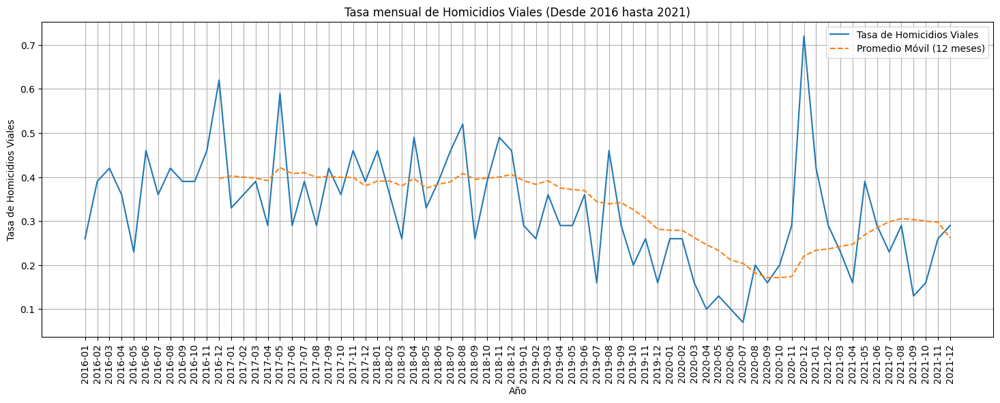

In [18]:
# Graficar la tasa de homicidios anuales
plt.figure(figsize=(18, 6))
poblacion_mensual['Promedio_Movil'] = poblacion_mensual['TASA_HOMICIDIOS'].rolling(window=12).mean()

plt.grid(True)
plt.xticks(rotation=90)

# Agregar nombres a los ejes
plt.xlabel('Año')
plt.ylabel('Tasa de Homicidios Viales')

# Agregar el promedio móvil al gráfico
plt.plot(poblacion_mensual['MESES'], poblacion_mensual['TASA_HOMICIDIOS'], label='Tasa de Homicidios Viales')
plt.plot(poblacion_mensual['MESES'], poblacion_mensual['Promedio_Movil'], label='Promedio Móvil (12 meses)', linestyle='--')

# Agregar título al gráfico
plt.title('Tasa mensual de Homicidios Viales (Desde 2016 hasta 2021)')

# Mostrar la leyenda
plt.legend()

# Mostrar el gráfico
plt.show()


Con el promedio móvil se puede ver que aún con el repunte en la tasa de homicidios viales en Diciembre de 2020, el comportamiento de la tasa en general ha disminuido desde la implementación del 5954 decto 101-2018. Sin embargo, precisamentem ese tipo de repuntes son los que indican que aún hay falencias en la solución planteada, y es por esto que vamos a continuar con este análisis.

•	Analizar la distribución de la hora en que ocurren los homicidios viales.

Comprender cuándo ocurren con mayor frecuencia los homicidios viales puede ayudar a las autoridades a tomar medidas para aumentar la seguridad pública durante esos períodos. Por ejemplo, si se encuentra que la mayoría de los homicidios viales ocurren en las primeras horas de la mañana, se pueden implementar patrullas adicionales o campañas de concientización para reducir el riesgo.

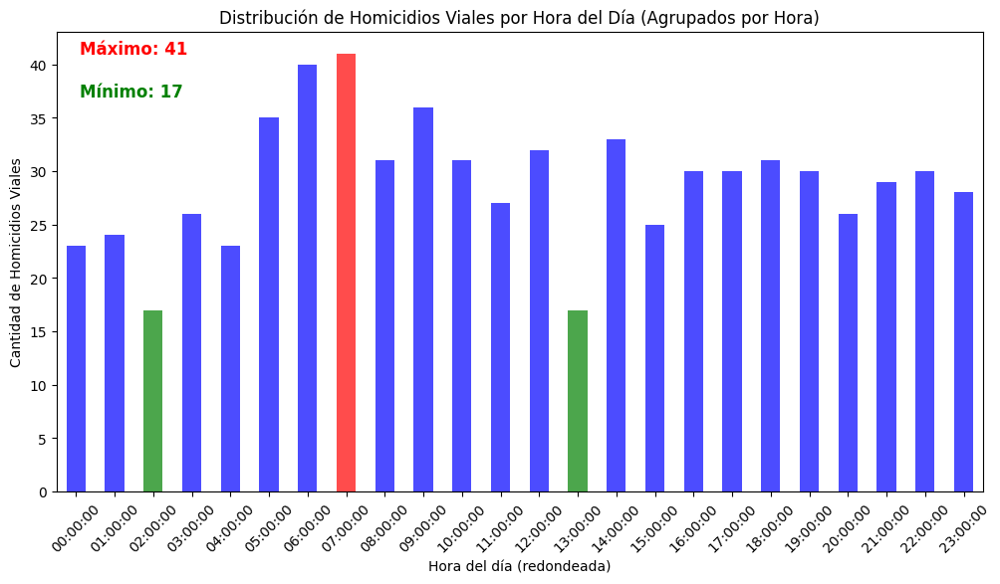

In [19]:
# Convertir la columna 'HORA' a objetos de tiempo
homicidios_hechos['HORA'] = pd.to_datetime(homicidios_hechos['HORA'], format='%H:%M:%S', errors='coerce').dt.time

# Filtrar valores NaT (No se puede formatear como hora)
homicidios_hechos = homicidios_hechos.dropna(subset=['HORA'])

# Redondear las horas al intervalo deseado (por ejemplo, al intervalo de 1 hora)
intervalo_horas = 1  # Cambia el intervalo según tu preferencia
homicidios_hechos['HORA'] = homicidios_hechos['HORA'].apply(
    lambda x: f"{x.hour // intervalo_horas * intervalo_horas:02d}:00:00"
)

# Contar la frecuencia de casos en cada hora
conteo_horas = homicidios_hechos['HORA'].value_counts().sort_index()

# Encuentra los valores máximos y mínimos
maximo = conteo_horas.max()
minimo = conteo_horas.min()

# Crea una lista de colores para los puntos máximos y mínimos
colores = ['red' if x == maximo else 'green' if x == minimo else 'blue' for x in conteo_horas]

# Crear el gráfico de barras
plt.figure(figsize=(12, 6))
conteo_horas.plot(kind='bar', color=colores, alpha=0.7)
plt.xlabel('Hora del día (redondeada)')
plt.ylabel('Cantidad de Homicidios Viales')
plt.title('Distribución de Homicidios Viales por Hora del Día (Agrupados por Hora)')
plt.xticks(rotation=45)

# Eliminar las cuadrículas o líneas del gráfico
plt.grid(False)

# Agregar comentarios
plt.text(0.1, maximo, f'Máximo: {maximo}', color='red', fontsize=12, fontweight='bold')
plt.text(0.1, minimo + 20, f'Mínimo: {minimo}', color='green', fontsize=12, fontweight='bold')

plt.show()

Como se puede ver en la gráfica las horas de menor occurencia de homicidios viales son la 2:00 AM y la 1:00 PM, esto se puede explicar a que en esas horas la mayoria de las personas no se están movilizando dado que están descansando o almorzando respectivamente. Por otro lado, las horas en las que más se presentan homicidios viales son las 6 y 7 AM, esto se puede explicar con que muchos conductores pueden estar fatigados o somnolientos en ese momento, ya que es temprano por la mañana y es posible que no hayan tenido suficiente descanso. 

•	Explorar la ubicación de los homicidios en función de la comuna y el tipo de calle.

También es importante tener en cuenta el tipo de calle en el que se presentan más homicidios viales porque este es un indicador de que la infraestructura vial no es segura para los actores viales.

C:\Users\Leidy Hernandez\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Leidy Hernandez\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Leidy Hernandez\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinst

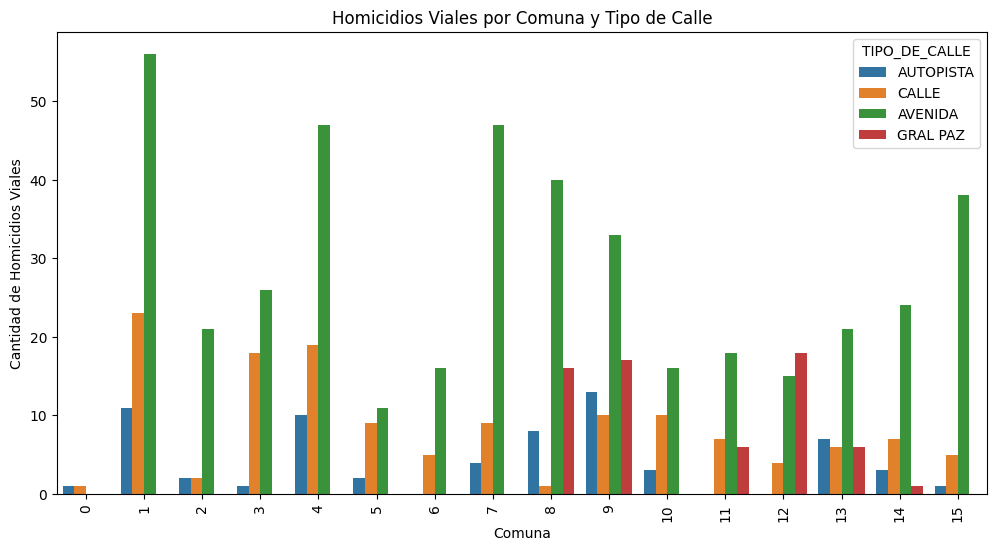

In [20]:
# Agrupar y contar los homicidios por comuna y tipo de calle
homicidios_por_comuna_tipo_calle = homicidios_hechos.groupby(['COMUNA', 'TIPO_DE_CALLE'])['N_VICTIMAS'].count().reset_index()

# Configurar el tamaño del gráfico
plt.figure(figsize=(12, 6))

# Crear el gráfico de barras agrupado
sns.barplot(data=homicidios_por_comuna_tipo_calle, x='COMUNA', y='N_VICTIMAS', hue='TIPO_DE_CALLE')
plt.title('Homicidios Viales por Comuna y Tipo de Calle')
plt.xlabel('Comuna')
plt.ylabel('Cantidad de Homicidios Viales')
plt.xticks(rotation=90)

# Mostrar el gráfico
plt.show()


La mayoría de los homicidios viales ocurren en las avenidas, y esto tiene sentido debido a varios factores. En primer lugar, las avenidas suelen tener un flujo de tráfico más alto en comparación con otros tipos de calles. Además, las avenidas son más comunes como tipo de calle dentro de la ciudad, lo que aumenta las posibilidades de que ocurran accidentes de tráfico, incluidos los homicidios viales. Llama la atención que en casi todas las comunas (a excepción de la comuna 12) la gran cantidad de homicidios viales ocurren en avenidas, esto indica que es necesario revisar la calidad de dichas vías o mayor presencia de supervisión vial en dichos sectores de la ciudad.

Por otro lado, en el gráfico también se observa que en la Comuna 1 se registra la mayor cantidad de homicidios viales. Esta comuna es una de las áreas más transitadas y turísticas de Buenos Aires. Alberga una gran cantidad de actividades culturales, comerciales y turísticas, y cada uno de sus barrios tiene su propio carácter y atractivo. Por lo tanto, se convierte en una parte importante de la vida urbana en la ciudad.

-- Lesiones

    NOTA: En este apartado se siguió un proceso muy similar al ya realizado con los DataFrames de homicidios.

•	Calcular la tasa de lesiones viales (número de lesiones viales por año o mes) como un KPI para seguimiento.

Al igual que en el apartado anterior, se calcula la tasa anual y mensual, en este caso de lesiones.

In [21]:
# Agrupar la cantidad de casos de lesiones viales por año
contador = [0] * len(poblacion_anual)  # Crear una lista de ceros de la misma longitud que poblacion_anual

for i in range(len(lesiones_victimas)):
    for j in range(len(poblacion_anual)):
        if lesiones_victimas['FECHA'][i].year == poblacion_anual['AÑO'][j]:
            contador[j] += 1

# Crear una nueva columna en poblacion_anual con la lista contador
poblacion_anual['LESIONES_VIALES'] = contador

# Calcular la tasa de lesiones viales por año 
rate = []
for i in range(len(poblacion_anual)):
    rate.append(round((poblacion_anual['LESIONES_VIALES'][i] / poblacion_anual['POBLACION_TOTAL'][i]) * 100000, 2))
poblacion_anual['TASA_LESIONES'] = rate

In [22]:
# Crear una lista vacía para almacenar los valores calculados
contador = []

# Iterar a través de los datos de lesiones_victimas y poblacion_anual
for i in range(len(poblacion_anual)):
    year = poblacion_anual['AÑO'][i]
    # Calcular la cantidad de lesiones para el año actual (year)
    lesiones_para_este_año = sum(1 for fecha in lesiones_victimas['FECHA'] if fecha.year == year)
    contador.append(lesiones_para_este_año)

# Agregar la lista de lesiones al DataFrame poblacion_anual
poblacion_anual['LESIONES_VIALES'] = contador

# Calcular la tasa de lesiones viales
poblacion_anual['TASA_LESIONES'] = round((poblacion_anual['LESIONES_VIALES'] / poblacion_anual['POBLACION_TOTAL']) * 100000,2)

    NOTA: Recuérdese que la tasa de lesiones no es porcentual. La tasa de 383.88 indica que, en promedio, hubo aproximadamente 383.88 lesiones viales por cada 100,000 habitantes en 2019.

•	Analizar la distribución de la hora y el día de la semana en que ocurren las lesiones viales.

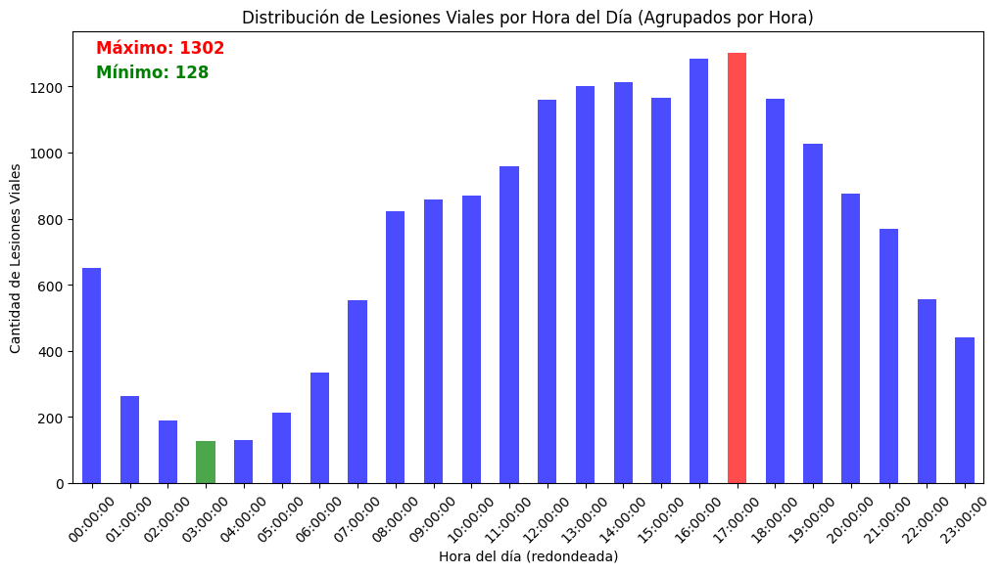

In [23]:
# Convertir la columna 'HORA' a objetos de tiempo
lesiones_hechos['HORA'] = pd.to_datetime(lesiones_hechos['HORA'], format='%H:%M:%S', errors='coerce').dt.time

# Filtrar valores NaT (No se puede formatear como hora)
lesiones_hechos.dropna(subset=['HORA'])

# Filtrar y eliminar filas con valores NaN en la columna 'HORA'
lesiones_hechos = lesiones_hechos.dropna(subset=['HORA'])

# Redondear las horas al intervalo deseado (por ejemplo, al intervalo de 1 hora)
intervalo_horas = 1  # Cambia el intervalo según tu preferencia
lesiones_hechos['HORA'] = lesiones_hechos['HORA'].apply(
    lambda x: f"{int(x.hour // intervalo_horas) * intervalo_horas:02d}:00:00"
)

# Contar la frecuencia de casos en cada hora
conteo_horas = lesiones_hechos['HORA'].value_counts().sort_index()

# Ahora puedes continuar con el análisis de las horas redondeadas


# Encuentra los valores máximos y mínimos
maximo = conteo_horas.max()
minimo = conteo_horas.min()

# Crea una lista de colores para los puntos máximos y mínimos
colores = ['red' if x == maximo else 'green' if x == minimo else 'blue' for x in conteo_horas]

# Crear el gráfico de barras
plt.figure(figsize=(12, 6))
conteo_horas.plot(kind='bar', color=colores, alpha=0.7)
plt.xlabel('Hora del día (redondeada)')
plt.ylabel('Cantidad de Lesiones Viales')
plt.title('Distribución de Lesiones Viales por Hora del Día (Agrupados por Hora)')
plt.xticks(rotation=45)

# Eliminar las cuadrículas o líneas del gráfico
plt.grid(False)

# Agregar comentarios
plt.text(0.1, maximo, f'Máximo: {maximo}', color='red', fontsize=12, fontweight='bold')
plt.text(0.1, minimo + 1100, f'Mínimo: {minimo}', color='green', fontsize=12, fontweight='bold')

plt.show()

A diferencia de los homicidios, a las al rededor de las 5:00 PM es la hora en que se presentan más lesiones. Esto concuerda con recientes reportes que indican que las horas pico en Buenos Aires inician a la 1:00 PM y se extiende hasta las 5:00 PM, y como se ve en nuestro gráfico, esas son las horas en las que más se presentan lesiones viales. Lo que significa que a mayor cantidad de flujo de vehículos entonces mayor cantidad de lesiones viales.

Fuente: https://www.lanacion.com.ar/buenos-aires/fin-de-la-hora-pico-cuales-son-los-horarios-con-mayor-circulacion-de-vehiculos-en-las-autopistas-y-nid04092023/ 

Para el caso puntual de las lesiones también vamos a tomar en cuenta en qué dias de la semana se presentan más frecuentemente. Esto es importante para proteger a los actores viales que más trancitan en esos dias.

In [24]:
# Identificar el día de la semana para cada lesión
lesiones_victimas['DIA_SEMANA'] = lesiones_victimas['FECHA'].dt.dayofweek
conteo_dias_semana = lesiones_victimas['DIA_SEMANA'].value_counts().sort_index()

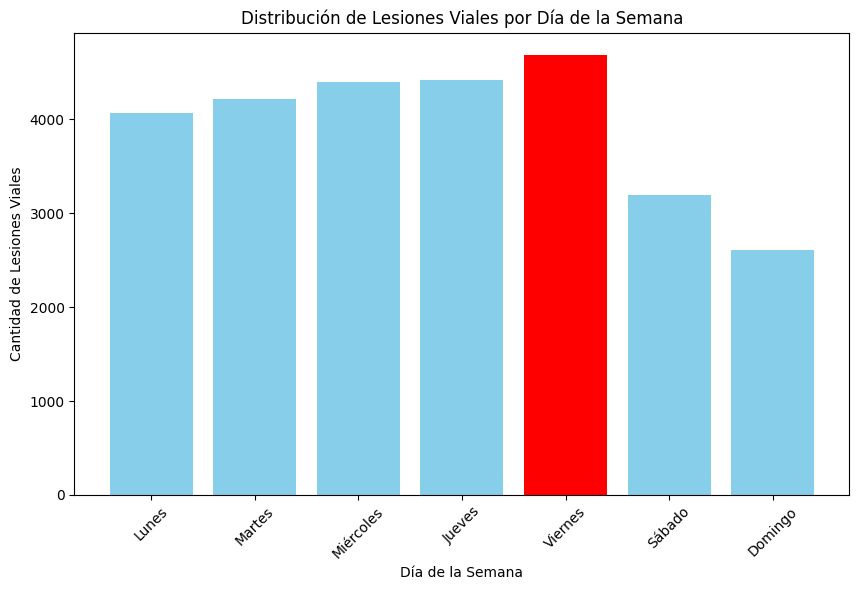

In [25]:
# Obtener el valor máximo y su índice
maximo = conteo_dias_semana.max()
indice_maximo = conteo_dias_semana.idxmax()

# Definir los nombres de los días de la semana
nombres_dias_semana = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']

# Crear una lista de colores donde todas las barras sean azules, excepto la barra máxima que será roja
colores = ['red' if i == indice_maximo else 'skyblue' for i in range(7)]

# Crear el gráfico de barras con colores personalizados
plt.figure(figsize=(10, 6))  
plt.bar(range(7), conteo_dias_semana, color=colores)
plt.xlabel('Día de la Semana')
plt.ylabel('Cantidad de Lesiones Viales')
plt.title('Distribución de Lesiones Viales por Día de la Semana')
plt.xticks(range(7), nombres_dias_semana, rotation=45)

# Mostrar el gráfico
plt.show()

Si bien es importante recordar que la causa de los accidentes de tráfico y las lesiones viales es multifactorial, una de las razones por las cuales se presentan más incidentes viales los días viernes es porque este suele marcar el inicio del fin de semana para muchas personas, lo que significa que hay un aumento en las actividades sociales y recreativas. Esto puede traducirse en un mayor número de personas en las calles, lo que aumenta las posibilidades de que ocurran accidentes de tráfico y, por lo tanto, lesiones viales.

Sin embargo, es importante destacar que en términos generales, las lesiones viales tienden a ocurrir principalmente en los días laborales. Esto se debe a la mayor actividad relacionada con el trabajo y el tráfico en esos días.

•	Explorar la distribución por tipo de vehículo involucrado.

 Al conocer los tipos de vehículos más propensos a estar involucrados en lesiones viales, las autoridades y las organizaciones de seguridad vial pueden implementar medidas específicas de prevención y regulación. Por ejemplo, pueden establecer límites de velocidad adecuados para ciertos tipos de vehículos o diseñar campañas de concientización dirigidas a conductores de vehículos específicos.

<Figure size 800x400 with 0 Axes>

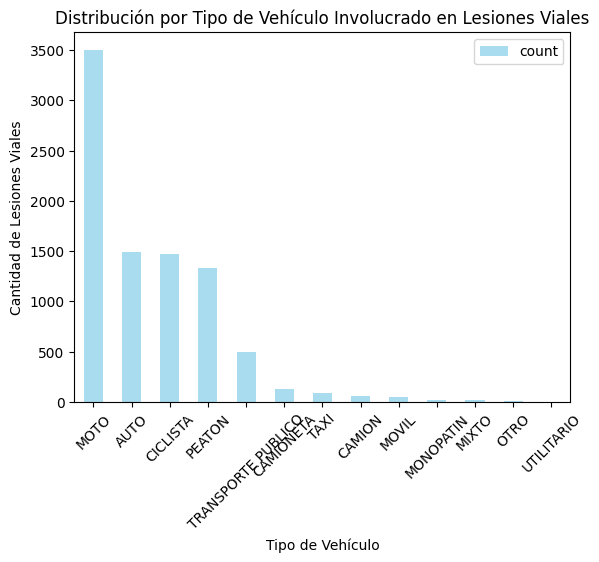

In [26]:
#  Calcular la frecuencia de cada tipo de vehículo
conteo_tipo_vehiculo = lesiones_hechos['VICTIMA'].value_counts()

# Como SD es "Sin Datos" entonces esto se elimina del análisis
conteo_tipo_vehiculo = pd.DataFrame(conteo_tipo_vehiculo)
conteo_tipo_vehiculo = conteo_tipo_vehiculo.drop('SD', axis=0)

# Crear el gráfico de barras
plt.figure(figsize=(8, 4))
conteo_tipo_vehiculo.plot(kind='bar', color='skyblue', alpha=0.7)
plt.xlabel('Tipo de Vehículo')
plt.ylabel('Cantidad de Lesiones Viales')
plt.title('Distribución por Tipo de Vehículo Involucrado en Lesiones Viales')
plt.xticks(rotation=45)

# Mostrar el gráfico
plt.show()

Es notorio que la mayoría de las lesiones viales se producen en motocicletas, y esto puede atribuirse a varias razones. Las motocicletas son vehículos altamente maniobrables, lo que las hace propensas a moverse con agilidad entre el tráfico. Sin embargo, si no se manejan con precaución, esta ventaja puede convertirse en un riesgo, ya que aumenta la posibilidad de colisiones y caídas. Además, algunos motociclistas pueden adoptar comportamientos de conducción riesgosos, como el exceso de velocidad o la omisión del uso de cascos protectores, lo que incrementa aún más el peligro de accidentes y lesiones.

Es crucial subrayar la importancia de que los motociclistas respeten los límites de velocidad y que sigan las normas de tráfico para mantener la seguridad vial, esto se puede controlar con cámaras o detectores de velocidad en zonas estrategicas  (como en las avenidas), así como capacitaciones en seguridad vial específicamente para motociclistas.

# 3. Análisis de víctimas.

•	Analizar la distribución de edades y sexos de las víctimas en ambos conjuntos de datos.

C:\Users\Leidy Hernandez\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Leidy Hernandez\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Leidy Hernandez\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinst

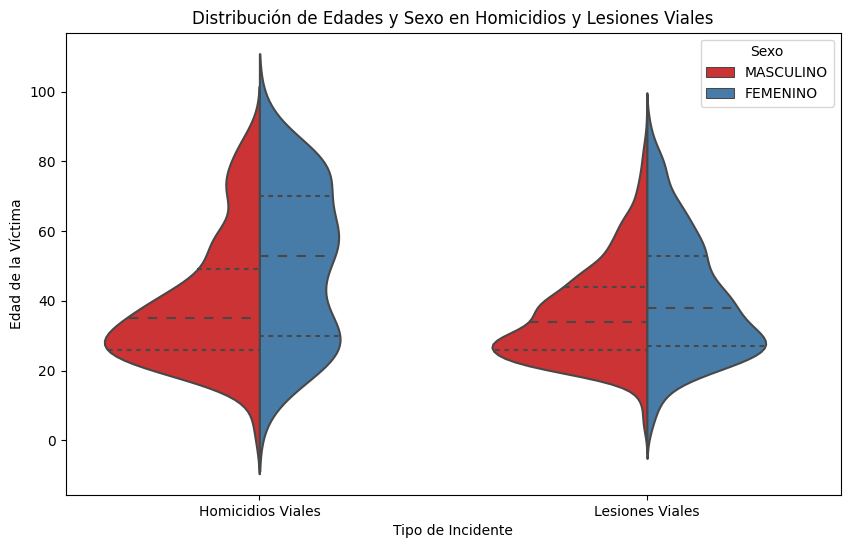

In [27]:
# Crear un nuevo DataFrame paraa organizar los datos para el gráfico
df = pd.concat([homicidios_victimas.assign(Tipo='Homicidios Viales'), lesiones_victimas.assign(Tipo='Lesiones Viales')])

# Reemplazar los valores NaN en 'EDAD_VICTIMA' por 0 (o cualquier otro valor deseado)
df['EDAD_VICTIMA'].fillna(0, inplace=True)

# Convertir la columna 'EDAD_VICTIMA' a tipo numérico
df['EDAD_VICTIMA'] = pd.to_numeric(df['EDAD_VICTIMA'], errors='coerce')

# Filtrar los valores no deseados en la columna 'EDAD_VICTIMA'
df = df[df['EDAD_VICTIMA'] > 0]

# Crear el gráfico de violín
plt.figure(figsize=(10, 6))
sns.violinplot(data=df, x='Tipo', y='EDAD_VICTIMA', hue='SEXO', split=True, inner='quart', palette='Set1')
plt.xlabel('Tipo de Incidente')
plt.ylabel('Edad de la Víctima')
plt.title('Distribución de Edades y Sexo en Homicidios y Lesiones Viales')
plt.legend(title='Sexo', loc='upper right')
plt.show()


Los datos sobre sexo y edad de las víctimas son fundamentales para desarrollar políticas públicas y medidas de seguridad efectivas. Por ejemplo, en este gráfico se observa que un grupo demográfico particular (jóvenes adultos, hombres y mujeres,en el rango de 20 a 40 años) tiene una alta probabilidad de ser victimas de un accidente de tráfico, y por ende se pueden implementar programas de educación vial específicos para este grupo.

•	Estudiar la relación entre la gravedad de las lesiones y el tipo de actor vial

Los resultados de este tipo de estudio pueden influir en las políticas y regulaciones de tráfico. Por ejemplo, si se encuentra que un cierto tipo de actor vial tiene una mayor probabilidad de sufrir lesiones graves, las autoridades pueden considerar implementar restricciones o regulaciones adicionales para mejorar su seguridad.

    NOTA: Hasta el momento los "SD" se estaban ignorando pero para efectos de este análisis van a ser tomados en cuenta.

En este caso se va a realizar la Prueba de Chi Cuadrado porque esta puede ayudar a identificar si existe una asociación significativa entre la gravedad de las lesiones y el tipo de actor vial (por ejemplo, peatones, ciclistas, conductores de automóviles, etc.). Si existe una asociación significativa, esto sugiere que el tipo de actor vial y la gravedad de las lesiones no son independientes, lo que es información importante.

C:\Users\Leidy Hernandez\AppData\Local\Temp\ipykernel_8444\1061565219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=expected_df, palette="Set1", ci=None)
C:\Users\Leidy Hernandez\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Leidy Hernandez\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Leidy Hernandez\AppData\Local\Packages\P

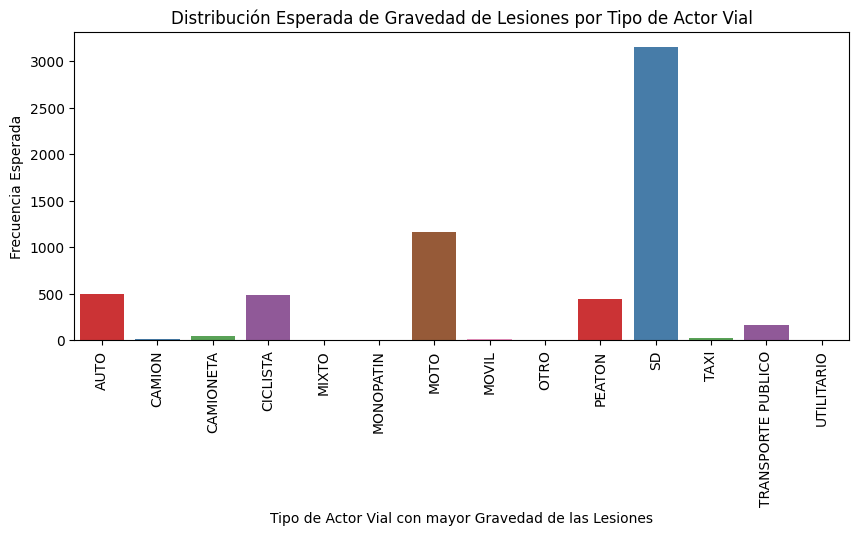

In [28]:
# Crear una tabla de contingencia
contingency_table = pd.crosstab(lesiones_hechos['GRAVEDAD'], lesiones_hechos['VICTIMA'])

# Realizar la prueba de chi-cuadrado
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Crear un DataFrame para los resultados esperados
expected_df = pd.DataFrame(expected, columns=contingency_table.columns, index=contingency_table.index)

# Crear el gráfico de barras apiladas
plt.figure(figsize=(10, 4))
sns.barplot(data=expected_df, palette="Set1", ci=None)
plt.xticks(rotation=90)
plt.xlabel('Tipo de Actor Vial con mayor Gravedad de las Lesiones')
plt.ylabel('Frecuencia Esperada')
plt.title('Distribución Esperada de Gravedad de Lesiones por Tipo de Actor Vial')
plt.show()



Con base a este gráfico podemos sacar un par de conclusiones. La primera y más evidente es que se están presentando una cantidad de accidentes de tránsito de gravedad considerable pero no se están recopilando estos datos, para llevar un control de los accidentes viales en toda la ciudad de Buenos Aires es necesario recopilar los datos de manera exitosa, un "Sin Datos" no es de gran provecho para los estudios. Es necesario fortalecer entidades encargadas de la recopilación de datos en la Ciudad de Buenos Aires.

Por otro lado, es notable que el actor vial con más lesiones graves son los motociclistas, esto es preocupante porque la diferencia con referencia a la distribución de los autos o los ciclistas es muy elevada. Como ya se había mencionado anteriormente, lo ideal es enfocar capacitaciones para los motociclistas y además aumentar sanciones para quienes no lleven los elementos de protección respectivos.

# 4. Análisis Espacial

•	Identificar áreas geográficas con una alta incidencia de siniestros viales y posiblemente de víctimas fatales.

Saber dónde ocurren la mayoría de los siniestros viales ayuda a las autoridades a asignar recursos de manera más eficiente. Pueden concentrar recursos como oficiales de tráfico, ambulancias y servicios de emergencia en áreas de mayor riesgo para brindar una respuesta más rápida en caso de accidentes.

In [29]:
# Elimina filas con valores NaN en las columnas 'LATITUD' y 'LONGITUD'
homicidios_hechos = homicidios_hechos.dropna(subset=['LATITUD', 'LONGITUD'])

# Convierte las columnas 'LATITUD' y 'LONGITUD' a tipo numérico si no lo son
homicidios_hechos['LATITUD'] = pd.to_numeric(homicidios_hechos['LATITUD'], errors='coerce')
homicidios_hechos['LONGITUD'] = pd.to_numeric(homicidios_hechos['LONGITUD'], errors='coerce')

# Elimina filas con valores NaN en las columnas 'LATITUD' y 'LONGITUD' nuevamente
homicidios_hechos = homicidios_hechos.dropna(subset=['LATITUD', 'LONGITUD'])

# Crea el mapa después de limpiar y convertir los datos
mapa = folium.Map(location=[-34.599722222222, -58.381944444444], zoom_start=12)

# Agrega marcadores para cada siniestro vial en el DataFrame 'lesiones_victimas'
for index, row in homicidios_hechos.iterrows():
    latitud = row['LATITUD']
    longitud = row['LONGITUD']
    descripcion = f'Número de Víctimas: {row["N_VICTIMAS"]}'  # Puedes personalizar la información mostrada en el marcador
    folium.Marker([latitud, longitud], tooltip=descripcion).add_to(mapa)

# Guarda el mapa en un archivo HTML o muestra el mapa en Jupyter Notebook
mapa.save('mapa_siniestros_viales.html')


    NOTA: El mapa se genera y se archiva de manera local.

En el mapa se puede notar que prácticamente en cualquier punto de la Avenida General Paz se presenta una alta accidentalidad, es importante colocar cámaras de control de velocidad y más presencia policial a lo largo de toda la Avenida. 

# 5. Creación de KPIs y Métricas Clave

Esta seccion es importante porque los KPIs se pueden alinear con los objetivos estratégicos de seguridad vial de la ciudad o la región. Esto ayuda a garantizar que las medidas implementadas estén en consonancia con los objetivos de reducción de accidentes y víctimas fatales.

* El Ministerio de Seguridad de la Nación se propuso reducir en un 10% la tasa de homicidios en siniestros viales de los últimos seis meses, en CABA, en comparación con la tasa de homicidios en siniestros viales del semestre anterior.

In [30]:
# Calcular la tasa de homicidios viales para cada semestre 
poblacion_semestral = pd.DataFrame()
poblacion_semestral['SEMESTRES'] = ['2016-1','2016-2','2017-1','2017-2','2018-1','2018-2','2019-1','2019-2','2020-1','2020-2','2021-1','2021-2']
poblacion_semestral['INICIO_SEMESTRE'] = pd.to_datetime(['2016-01-01','2016-07-01','2017-01-01','2017-07-01','2018-01-01','2018-07-01','2019-01-01','2019-07-01','2020-01-01','2020-07-01','2021-01-01','2021-07-01'])
poblacion_semestral['FIN_SEMESTRE'] = pd.to_datetime(['2016-06-30','2016-12-31','2017-06-30','2017-12-31','2018-06-30','2018-12-31','2019-06-30','2019-12-31','2020-06-30','2020-12-31','2021-06-30','2021-12-31'])

tot_pob = []
for i in range(len(poblacion_semestral)):
    for j in range(len(poblacion_anual)):
        if poblacion_semestral['INICIO_SEMESTRE'][i].year == poblacion_anual['AÑO'][j]:
            tot_pob.append(poblacion_anual['POBLACION_TOTAL'][j])
poblacion_semestral['POBLACION_TOTAL'] = tot_pob

# Agrupa la cantidad de casos de homicidio vial por semestre
contador = list(np.zeros(len(poblacion_semestral)))

for i in range(len(homicidios_victimas)):
    for j in range(len(poblacion_semestral)):
        # Verifica si la fecha del homicidio está dentro del semestre correspondiente
        fecha_homicidio = homicidios_victimas['FECHA'][i]
        inicio_semestre = poblacion_semestral['INICIO_SEMESTRE'][j]
        fin_semestre = poblacion_semestral['FIN_SEMESTRE'][j]

        if inicio_semestre <= fecha_homicidio <= fin_semestre:
            contador[j] += 1
            contador[j] = int(contador[j])

poblacion_semestral['HOMICIDIOS_VIALES'] = contador

# Calcula la tasa de homicidios viales por semestre
rate = []

for i in range(len(poblacion_semestral)):
    rate.append(round((poblacion_semestral['HOMICIDIOS_VIALES'][i] / poblacion_semestral['POBLACION_TOTAL'][i]) * 100000, 2))

poblacion_semestral['TASA_HOMICIDIOS'] = rate

In [ ]:
# Ahora se calcula la variación porcentual entre semestres para la tasa de homicidios 
var = ['-']
for i in range(1,len(poblacion_semestral)):
    tasa_actual = poblacion_semestral['TASA_HOMICIDIOS'][i]
    tasa_anterior = poblacion_semestral['TASA_HOMICIDIOS'][i-1]
    # Calcula la variación porcentual
    variacion_porcentual = ((tasa_actual - tasa_anterior) / tasa_anterior) * 100
    var.append(variacion_porcentual)

poblacion_semestral['VARIACIÓN_PORCENTUAL'] = var

In [37]:
poblacion_semestral[['SEMESTRES','HOMICIDIOS_VIALES','TASA_HOMICIDIOS','VARIACIÓN_PORCENTUAL']]

,SEMESTRES,HOMICIDIOS_VIALES,TASA_HOMICIDIOS,VARIACIÓN_PORCENTUAL
0,2016-1,65,2.12,-
1,2016-2,81,2.65,25.0
2,2017-1,69,2.25,-15.09434
3,2017-2,71,2.32,3.111111
4,2018-1,70,2.28,-1.724138
5,2018-2,79,2.57,12.719298
6,2019-1,57,1.86,-27.626459
7,2019-2,47,1.53,-17.741935
8,2020-1,31,1.01,-33.986928
9,2020-2,50,1.63,61.386139


La variación porcentual de la tasa de homicidios viales disminuyó considerablemente en el último semestre analizado, presentó una dismunución de -24.02% (La tasa pasó de 1.79 a 1.36) y si bien esto indica que se realizó un gran trabajo al reducir dicha tasa y alcanzar el objetivo, aún hay que continuar trabajando en mejorar la cifra de fallecidos en siniestros viales puesto que 42 familias fueron afectadas.

* Reducir en un 7% la cantidad de accidentes mortales de motociclistas en el último año, en CABA, respecto al año anterior

Este objetivo es bastante importante ya que casi la mitad de las victimas fatales de los siniestros viales son los motociclistas.

In [32]:
# Primero se calcula la tasa anual de homicidios viales en motociclistas 

contador = list(np.zeros(len(poblacion_anual)))
for i in range(len(homicidios_victimas)):
    for j in range(len(poblacion_anual)):
        if homicidios_victimas['FECHA'][i].year == poblacion_anual['AÑO'][j] and homicidios_victimas['VICTIMA'][i] == "MOTO":
            contador[j] += 1
            contador[j] = int(contador[j])
poblacion_anual['HOMICIDIOS_MOTOS'] = contador

# Calcular la tasa de homicidios viales por año 
rate = []
for i in range(len(poblacion_anual)):
    rate.append(round((poblacion_anual['HOMICIDIOS_MOTOS'][i]/poblacion_anual['POBLACION_TOTAL'][i])*100000,2))
poblacion_anual['TASA_H_MOTOS'] = rate

In [33]:
# Ahora se calcula la variación porcentual entre años para la tasa de homicidios viales en motos
var = ['-']
for i in range(1,len(poblacion_anual)):
    tasa_actual = poblacion_anual['TASA_HOMICIDIOS'][i]
    tasa_anterior = poblacion_anual['TASA_HOMICIDIOS'][i-1]
    # Calcula la variación porcentual
    variacion_porcentual = ((tasa_actual - tasa_anterior) / tasa_anterior) * 100
    var.append(variacion_porcentual)

poblacion_anual['VAR_PORC_MOTOS'] = var

In [39]:
poblacion_anual[['AÑO','HOMICIDIOS_MOTOS','TASA_H_MOTOS','VAR_PORC_MOTOS']]

,AÑO,HOMICIDIOS_MOTOS,TASA_H_MOTOS,VAR_PORC_MOTOS
0,2016,65,2.12,-
1,2017,56,1.83,-4.192872
2,2018,57,1.86,6.345733
3,2019,50,1.63,-30.246914
4,2020,29,0.94,-22.418879
5,2021,46,1.49,19.771863


En el año 2021 se presentó un aumento en la tasa de homicidios viales en motociclistas de 19.77% (la tasa anual pasó de 0.94 a 1.49). Como sugerencia para cumplir este objetivo, que de hecho ya se ha mencionado, se pueden hacer capacitaciones de conciencia vial específicamente para motociclistas así como aumentar el control del uso de las herramientas de seguridad como el casco.

* Reducir la tasa anual de homicidios viales en las avenidas en un 20% con respecto al año anterior.

Este objetivo se propone con base la sección 2. puesto que al explorar la ubicación de los homicidios en función de la comuna y el tipo de calle se encontró que las avenidas son los lugares donde más ocurren siniestros viales fatales.

In [34]:
# Hay que resetear los índices en este dataframe
homicidios_hechos = homicidios_hechos.reset_index(drop=True)

# Primero se calcula la tasa anual de homicidios viales en avenidas 

contador = list(np.zeros(len(poblacion_anual)))
for i in range(len(homicidios_hechos)):
    for j in range(len(poblacion_anual)):
        if homicidios_hechos['FECHA'][i].year == poblacion_anual['AÑO'][j] and homicidios_hechos['TIPO_DE_CALLE'][i] == "AVENIDA":
            contador[j] += 1
            contador[j] = int(contador[j])
poblacion_anual['HOMICIDIOS_AVENIDA'] = contador

# Calcular la tasa de homicidios en avenidas por año 
rate = []
for i in range(len(poblacion_anual)):
    rate.append(round((poblacion_anual['HOMICIDIOS_AVENIDA'][i]/poblacion_anual['POBLACION_TOTAL'][i])*100000,2))
poblacion_anual['TASA_H_AVENIDA'] = rate

In [35]:
# Ahora se calcula la variación porcentual entre años para la tasa de homicidios viales en motos
var = ['-']
for i in range(1,len(poblacion_anual)):
    tasa_actual = poblacion_anual['HOMICIDIOS_AVENIDA'][i]
    tasa_anterior = poblacion_anual['HOMICIDIOS_AVENIDA'][i-1]
    # Calcula la variación porcentual
    variacion_porcentual = ((tasa_actual - tasa_anterior) / tasa_anterior) * 100
    var.append(variacion_porcentual)

poblacion_anual['VAR_PORC_AVENIDA'] = var

In [41]:
poblacion_anual[['AÑO','HOMICIDIOS_AVENIDA','TASA_H_AVENIDA','VAR_PORC_AVENIDA']]

,AÑO,HOMICIDIOS_AVENIDA,TASA_H_AVENIDA,VAR_PORC_AVENIDA
0,2016,90,2.94,-
1,2017,76,2.48,-15.555556
2,2018,89,2.90,17.105263
3,2019,63,2.05,-29.213483
4,2020,50,1.63,-20.634921
5,2021,61,1.98,22.0


En los últimos años, la tasa de homicidios viales en las avenidas ha experimentado fluctuaciones significativas, y lamentablemente, no se logró cumplir con el objetivo el año pasado. Sin embargo, con un aumento en la presencia de las autoridades viales en las avenidas, esperamos reducir esta tasa de manera efectiv

# 6. Conclusiones y sugerencias

Este proyecto de análisis de datos es un esfuerzo cuyo objetivo es contribuir a la seguridad vial en la Ciudad de Buenos Aires. Los resultados de este análisis servirán como base para la implementación de políticas y acciones concretas que ayuden a reducir la cantidad de víctimas fatales en siniestros viales, salvaguardando la vida de los habitantes de la ciudad. Las siguientes sugerencias son tomadas del anterior análisis aquí descrito y pueden ser aplicadas para reducir los siniestros viales en Buenos Aires.

* El 5954 decto 101-2018 ha surtido gran efecto reduciendo los homicidios viales, específicamente por las capacitaciones segmentadas por edades. Es importante continuar con estas capacitaciones y se sugiere que sean constantes (que sea brindada al menos una vez al año para toda la comunidad).
* Las capacitaciones deberían también incluir advertencias o consejos para que todos los actores viales tengan buen descanso y así evitar siniestros viales por causa de la somnolencia, esto es para disminuir la accidentalidad a tempranas horas del día.
* Aumentar la presencia de policía de trámsito en la comuna 1, dado que esta es la comuna más concurrida y en la que más se presentan siniestros viales. 
* Disponer mayor inversión para la infraestructura de avenidas en todas las comunas.
* Tener mayor presencia de autoridades viales durante las horas pico para garantizar el flujo tranquilo de vehículos.
* Instalar cámaras o detectores de velocidad en zonas estrategicas.
* Brindar capacitaciones en seguridad vial específicamente para motociclistas y aumentar el control del uso del casco de seguridad para ellos. 
* De ser necesario, aplicar multas si no se llevan los elementos de protección de manera adecuada.
* Fortalecer entidades encargadas de la recopilación de datos o bien crear un grupo de estadistas específicamente dedicados a los casos de siniestros viales.
* Mantener bajo vigilancia constante el comportamiento de los conductores en la Avenida General Paz.
